## Importations

In [46]:
import os
import sys 
import time
import copy
import random
import json
import numpy as np
from PIL import Image
import glob

import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F
from torch.utils.data import DataLoader
from torchvision import transforms, models
from torchvision.datasets import ImageFolder

from sklearn.metrics import classification_report, confusion_matrix, precision_recall_fscore_support
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import seaborn as sns

import warnings
warnings.filterwarnings('ignore')

## Parameters

In [2]:
SEED            = 42
IMAGE_SIZE      = 224
BATCH_SIZE      = 32
NUM_WORKERS     = 2
NUM_EPOCHS      = 15        # epochs totaux (phase 1 frozen + phase 2 finetune)
LR_FROZEN       = 1e-3      # phase 1 : backbone gelé
LR_FINETUNE     = 1e-4      # phase 2 : tout dégelé
WEIGHT_DECAY    = 1e-4

# Adversarial training PGD intégré
ADV_EPSILON     = 0.03
ADV_ALPHA       = 0.007
ADV_STEPS       = 7
ADV_RATIO       = 0.5       # 50% du batch = exemples adversariaux

# Attaques de test
FGSM_EPSILONS   = [0.01, 0.03, 0.05, 0.1, 0.15]
PGD_EPSILONS    = [0.01, 0.03, 0.05, 0.1]
POISON_FRACS    = [0.05, 0.1, 0.2, 0.3]

# Kaggle dataset path
DATA_DIR = "/kaggle/input/datasets/misrakahmed/vegetable-image-dataset/Vegetable Images"
OUTPUT_DIR = "/kaggle/working"

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")

random.seed(SEED)
np.random.seed(SEED)
torch.manual_seed(SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed_all(SEED)

print(f"Device: {DEVICE}")
print(f"PyTorch: {torch.__version__}")
if torch.cuda.is_available():
    print(f"GPU: {torch.cuda.get_device_name(0)}")

Device: cuda
PyTorch: 2.8.0+cu126
GPU: Tesla T4


# Hardening Model training

## Loading & Preprocessing

In [3]:
print("=" * 65)
print(" PARTIE 1 : CHARGEMENT DES DONNÉES + ENTRAÎNEMENT ROBUSTE")
print("=" * 65)

normalize = transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])

train_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.RandomHorizontalFlip(),
    transforms.RandomRotation(15),
    transforms.ColorJitter(brightness=0.2, contrast=0.2, saturation=0.2, hue=0.1),
    transforms.RandomAffine(degrees=0, translate=(0.1, 0.1)),
    transforms.ToTensor(),
    normalize,
])

eval_transform = transforms.Compose([
    transforms.Resize((IMAGE_SIZE, IMAGE_SIZE)),
    transforms.ToTensor(),
    normalize,
])

# Vegetable Imaga Dataset is already split into train / test / validation data
train_dataset = ImageFolder(os.path.join(DATA_DIR, "train"), transform=train_transform)
val_dataset   = ImageFolder(os.path.join(DATA_DIR, "validation"), transform=eval_transform)
test_dataset  = ImageFolder(os.path.join(DATA_DIR, "test"), transform=eval_transform)

train_loader = DataLoader(train_dataset, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS, pin_memory=True)
val_loader   = DataLoader(val_dataset,   batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)
test_loader  = DataLoader(test_dataset,  batch_size=BATCH_SIZE, shuffle=False, num_workers=NUM_WORKERS, pin_memory=True)

CLASS_NAMES = train_dataset.classes
NUM_CLASSES = len(CLASS_NAMES)

print(f"\nClasses ({NUM_CLASSES}): {CLASS_NAMES}")
print(f"Train: {len(train_dataset)} | Val: {len(val_dataset)} | Test: {len(test_dataset)}")



 PARTIE 1 : CHARGEMENT DES DONNÉES + ENTRAÎNEMENT ROBUSTE

Classes (15): ['Bean', 'Bitter_Gourd', 'Bottle_Gourd', 'Brinjal', 'Broccoli', 'Cabbage', 'Capsicum', 'Carrot', 'Cauliflower', 'Cucumber', 'Papaya', 'Potato', 'Pumpkin', 'Radish', 'Tomato']
Train: 15000 | Val: 3000 | Test: 3000


## Model Construction

In [4]:
print("\n── Construction EfficientNet-B0 ──")

model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)
in_features = model.classifier[1].in_features
model.classifier = nn.Sequential(
    nn.Dropout(p=0.3, inplace=True),
    nn.Linear(in_features, 256),
    nn.ReLU(),
    nn.Dropout(p=0.2),
    nn.Linear(256, NUM_CLASSES),
)
model = model.to(DEVICE)

total_params = sum(p.numel() for p in model.parameters())
trainable_params = sum(p.numel() for p in model.parameters() if p.requires_grad)
print(f"Paramètres: {total_params:,} total | {trainable_params:,} entraînables")

criterion = nn.CrossEntropyLoss(label_smoothing=0.1)


── Construction EfficientNet-B0 ──
Downloading: "https://download.pytorch.org/models/efficientnet_b0_rwightman-7f5810bc.pth" to /root/.cache/torch/hub/checkpoints/efficientnet_b0_rwightman-7f5810bc.pth


100%|██████████| 20.5M/20.5M [00:00<00:00, 121MB/s] 


Paramètres: 4,339,339 total | 4,339,339 entraînables


## Attacks Function

In [5]:
# %% — Fonctions d'attaque PGD (utilisées pendant l'entraînement ET les tests)

def pgd_attack(mdl, images, labels, epsilon, alpha, steps):
    """PGD — Projected Gradient Descent (Madry et al., 2017)"""
    adv = images.clone().detach() + torch.empty_like(images).uniform_(-epsilon, epsilon)
    for _ in range(steps):
        adv.requires_grad = True
        loss = F.cross_entropy(mdl(adv), labels)
        mdl.zero_grad()
        loss.backward()
        adv = adv.detach() + alpha * adv.grad.sign()
        delta = torch.clamp(adv - images, -epsilon, epsilon)
        adv = images + delta
    return adv.detach()

def fgsm_attack(mdl, images, labels, epsilon):
    """FGSM — Fast Gradient Sign Method (Goodfellow et al., 2014)"""
    images_cp = images.clone().detach().requires_grad_(True)
    loss = F.cross_entropy(mdl(images_cp), labels)
    mdl.zero_grad()
    loss.backward()
    return (images_cp + epsilon * images_cp.grad.sign()).detach()


## Adversarial Training

### Initial Training

In [6]:
# %% — PHASE 1 : Feature extraction (backbone gelé) + adversarial training
print("\n▶ Phase 1 : Feature extraction (backbone gelé) + adversarial training")

for param in model.features.parameters():
    param.requires_grad = False

optimizer = optim.Adam(filter(lambda p: p.requires_grad, model.parameters()), lr=LR_FROZEN, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.StepLR(optimizer, step_size=5, gamma=0.5)

history = {"train_loss": [], "train_acc": [], "val_loss": [], "val_acc": []}
best_val_acc = 0.0
PHASE1_EPOCHS = NUM_EPOCHS // 2

for epoch in range(1, PHASE1_EPOCHS + 1):
    # ── Train ──
    model.train()
    running_loss, correct, total = 0.0, 0, 0

    for images, labels in train_loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        bs = images.size(0)
        n_adv = int(bs * ADV_RATIO)

        # Générer les adversariaux pour la première moitié du batch
        model.eval()
        adv_images = pgd_attack(model, images[:n_adv], labels[:n_adv], ADV_EPSILON, ADV_ALPHA, ADV_STEPS)
        model.train()

        combined = torch.cat([adv_images, images[n_adv:]], dim=0)
        combined_labels = torch.cat([labels[:n_adv], labels[n_adv:]], dim=0)

        optimizer.zero_grad()
        outputs = model(combined)
        loss = criterion(outputs, combined_labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * combined.size(0)
        _, preds = outputs.max(1)
        total += combined_labels.size(0)
        correct += preds.eq(combined_labels).sum().item()

    train_loss = running_loss / total
    train_acc = 100.0 * correct / total
    scheduler.step()

    # ── Validation ──
    model.eval()
    val_loss_sum, val_correct, val_total = 0.0, 0, 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            val_loss_sum += F.cross_entropy(outputs, labels, reduction='sum').item()
            val_correct += outputs.argmax(1).eq(labels).sum().item()
            val_total += labels.size(0)
    val_loss = val_loss_sum / val_total
    val_acc = 100.0 * val_correct / val_total

    history["train_loss"].append(train_loss)
    history["train_acc"].append(train_acc)
    history["val_loss"].append(val_loss)
    history["val_acc"].append(val_acc)

    print(f"  Epoch [{epoch}/{PHASE1_EPOCHS}] "
          f"Train: {train_loss:.4f} / {train_acc:.2f}% | "
          f"Val: {val_loss:.4f} / {val_acc:.2f}%")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), os.path.join(OUTPUT_DIR, "best_phase1.pth"))

print(f"  → Meilleure val accuracy phase 1: {best_val_acc:.2f}%")


▶ Phase 1 : Feature extraction (backbone gelé) + adversarial training
  Epoch [1/7] Train: 2.1540 / 48.39% | Val: 0.4453 / 97.87%
  Epoch [2/7] Train: 1.9905 / 51.58% | Val: 0.3469 / 98.67%
  Epoch [3/7] Train: 1.9465 / 52.30% | Val: 0.3027 / 99.07%
  Epoch [4/7] Train: 1.9259 / 52.87% | Val: 0.2996 / 99.07%
  Epoch [5/7] Train: 1.9045 / 53.60% | Val: 0.2660 / 99.03%
  Epoch [6/7] Train: 1.8671 / 53.77% | Val: 0.2353 / 99.33%
  Epoch [7/7] Train: 1.8499 / 54.47% | Val: 0.2430 / 99.37%
  → Meilleure val accuracy phase 1: 99.37%


### Fine Tuning

In [7]:
# %% — PHASE 2 : Fine-tuning complet + adversarial training
print("\n▶ Phase 2 : Fine-tuning complet + adversarial training")

for param in model.features.parameters():
    param.requires_grad = True

optimizer = optim.Adam(model.parameters(), lr=LR_FINETUNE, weight_decay=WEIGHT_DECAY)
scheduler = optim.lr_scheduler.CosineAnnealingLR(optimizer, T_max=NUM_EPOCHS - PHASE1_EPOCHS)

PHASE2_EPOCHS = NUM_EPOCHS - PHASE1_EPOCHS

for epoch in range(1, PHASE2_EPOCHS + 1):
    t0 = time.time()
    model.train()
    running_loss, correct, total = 0.0, 0, 0

    for images, labels in train_loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        bs = images.size(0)
        n_adv = int(bs * ADV_RATIO)

        model.eval()
        adv_images = pgd_attack(model, images[:n_adv], labels[:n_adv], ADV_EPSILON, ADV_ALPHA, ADV_STEPS)
        model.train()

        combined = torch.cat([adv_images, images[n_adv:]], dim=0)
        combined_labels = torch.cat([labels[:n_adv], labels[n_adv:]], dim=0)

        optimizer.zero_grad()
        outputs = model(combined)
        loss = criterion(outputs, combined_labels)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * combined.size(0)
        _, preds = outputs.max(1)
        total += combined_labels.size(0)
        correct += preds.eq(combined_labels).sum().item()

    train_loss = running_loss / total
    train_acc = 100.0 * correct / total
    scheduler.step()

    # Validation
    model.eval()
    val_loss_sum, val_correct, val_total = 0.0, 0, 0
    with torch.no_grad():
        for images, labels in val_loader:
            images, labels = images.to(DEVICE), labels.to(DEVICE)
            outputs = model(images)
            val_loss_sum += F.cross_entropy(outputs, labels, reduction='sum').item()
            val_correct += outputs.argmax(1).eq(labels).sum().item()
            val_total += labels.size(0)
    val_loss = val_loss_sum / val_total
    val_acc = 100.0 * val_correct / val_total
    elapsed = time.time() - t0

    history["train_loss"].append(train_loss)
    history["train_acc"].append(train_acc)
    history["val_loss"].append(val_loss)
    history["val_acc"].append(val_acc)

    print(f"  Epoch [{epoch}/{PHASE2_EPOCHS}] "
          f"Train: {train_loss:.4f} / {train_acc:.2f}% | "
          f"Val: {val_loss:.4f} / {val_acc:.2f}% | {elapsed:.1f}s")

    if val_acc > best_val_acc:
        best_val_acc = val_acc
        torch.save(model.state_dict(), os.path.join(OUTPUT_DIR, "best_robust.pth"))

# Charger les meilleurs poids
model.load_state_dict(torch.load(os.path.join(OUTPUT_DIR, "best_robust.pth"), weights_only=True))
print(f"\n Meilleure val accuracy globale: {best_val_acc:.2f}%")



▶ Phase 2 : Fine-tuning complet + adversarial training
  Epoch [1/8] Train: 1.2122 / 77.89% | Val: 0.0508 / 99.67% | 330.2s
  Epoch [2/8] Train: 0.7517 / 94.77% | Val: 0.0511 / 99.83% | 343.6s
  Epoch [3/8] Train: 0.6797 / 97.62% | Val: 0.0497 / 99.90% | 346.2s
  Epoch [4/8] Train: 0.6528 / 98.27% | Val: 0.0541 / 99.90% | 338.1s
  Epoch [5/8] Train: 0.6361 / 98.81% | Val: 0.0548 / 99.93% | 337.5s
  Epoch [6/8] Train: 0.6263 / 99.10% | Val: 0.0560 / 99.93% | 336.1s
  Epoch [7/8] Train: 0.6177 / 99.42% | Val: 0.0574 / 99.93% | 337.5s
  Epoch [8/8] Train: 0.6165 / 99.39% | Val: 0.0591 / 99.93% | 336.1s

 Meilleure val accuracy globale: 99.93%


## Save Model

In [8]:
# %% — Sauvegarde du modèle final
save_path = os.path.join(OUTPUT_DIR, "vegetable_efficientnet_robust.pth")
torch.save({
    "model_state_dict": model.state_dict(),
    "architecture": "efficientnet_b0",
    "num_classes": NUM_CLASSES,
    "class_names": CLASS_NAMES,
    "best_val_acc": best_val_acc,
    "training": "adversarial_pgd",
    "adv_epsilon": ADV_EPSILON,
    "adv_steps": ADV_STEPS,
}, save_path)
print(f" Modèle sauvegardé: {save_path}")

 Modèle sauvegardé: /kaggle/working/vegetable_efficientnet_robust.pth


## Evaluation

In [9]:
# %% — Évaluation sur le test set (données propres)
print("\n── Évaluation sur le test set (données propres) ──")
model.eval()
all_preds, all_labels = [], []
test_loss_sum, test_total = 0.0, 0

with torch.no_grad():
    for images, labels in test_loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        outputs = model(images)
        test_loss_sum += F.cross_entropy(outputs, labels, reduction='sum').item()
        all_preds.extend(outputs.argmax(1).cpu().numpy())
        all_labels.extend(labels.cpu().numpy())
        test_total += labels.size(0)

all_preds = np.array(all_preds)
all_labels = np.array(all_labels)
test_loss = test_loss_sum / test_total
test_acc = 100.0 * (all_preds == all_labels).sum() / len(all_labels)
precision, recall, f1, _ = precision_recall_fscore_support(all_labels, all_preds, average='weighted')

print(f"  Test Loss:      {test_loss:.4f}")
print(f"  Test Accuracy:  {test_acc:.2f}%")
print(f"  Precision:      {precision:.4f}")
print(f"  Recall:         {recall:.4f}")
print(f"  F1-Score:       {f1:.4f}")
print(f"\n{classification_report(all_labels, all_preds, target_names=CLASS_NAMES)}")

clean_test_acc = test_acc
clean_test_f1 = f1
clean_cm = confusion_matrix(all_labels, all_preds)



── Évaluation sur le test set (données propres) ──
  Test Loss:      0.0554
  Test Accuracy:  99.93%
  Precision:      0.9993
  Recall:         0.9993
  F1-Score:       0.9993

              precision    recall  f1-score   support

        Bean       1.00      1.00      1.00       200
Bitter_Gourd       1.00      0.99      1.00       200
Bottle_Gourd       1.00      1.00      1.00       200
     Brinjal       1.00      1.00      1.00       200
    Broccoli       1.00      1.00      1.00       200
     Cabbage       1.00      0.99      1.00       200
    Capsicum       1.00      1.00      1.00       200
      Carrot       1.00      1.00      1.00       200
 Cauliflower       1.00      1.00      1.00       200
    Cucumber       1.00      1.00      1.00       200
      Papaya       1.00      1.00      1.00       200
      Potato       1.00      1.00      1.00       200
     Pumpkin       1.00      1.00      1.00       200
      Radish       1.00      1.00      1.00       200
      Tomat

# Adversarials Attacks Tests

In [ ]:
print("\n" + "=" * 65)
print(" PARTIE 2 : TESTS D'ATTAQUES ADVERSARIALES")
print("=" * 65)

## Fast Gradient Sign Method

In [10]:
# %% — FGSM à différents epsilon
print("\n── 2.1 : Attaque FGSM (Fast Gradient Sign Method) ──")
model.eval()
fgsm_results = []

for eps in FGSM_EPSILONS:
    correct_adv, total_adv = 0, 0
    adv_preds_all, adv_labels_all = [], []

    for images, labels in test_loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        adv_images = fgsm_attack(model, images, labels, eps)
        with torch.no_grad():
            preds_adv = model(adv_images).argmax(1)
        correct_adv += preds_adv.eq(labels).sum().item()
        total_adv += labels.size(0)
        adv_preds_all.extend(preds_adv.cpu().numpy())
        adv_labels_all.extend(labels.cpu().numpy())

    acc_adv = 100.0 * correct_adv / total_adv
    drop = clean_test_acc - acc_adv
    _, _, f1_adv, _ = precision_recall_fscore_support(adv_labels_all, adv_preds_all, average='weighted', zero_division=0)

    fgsm_results.append({"epsilon": eps, "accuracy": acc_adv, "drop": drop, "f1": f1_adv})
    print(f"  ε={eps:.2f} → Accuracy: {acc_adv:.2f}% (↓{drop:.2f}%) | F1: {f1_adv:.4f}")


── 2.1 : Attaque FGSM (Fast Gradient Sign Method) ──
  ε=0.01 → Accuracy: 99.90% (↓0.03%) | F1: 0.9990
  ε=0.03 → Accuracy: 99.47% (↓0.47%) | F1: 0.9947
  ε=0.05 → Accuracy: 98.90% (↓1.03%) | F1: 0.9890
  ε=0.10 → Accuracy: 96.53% (↓3.40%) | F1: 0.9653
  ε=0.15 → Accuracy: 93.57% (↓6.37%) | F1: 0.9356


## PGD

In [11]:
print("\n── 2.2 : Attaque PGD (Projected Gradient Descent) ──")
pgd_results = []

for eps in PGD_EPSILONS:
    correct_adv, total_adv = 0, 0
    adv_preds_all, adv_labels_all = [], []

    for images, labels in test_loader:
        images, labels = images.to(DEVICE), labels.to(DEVICE)
        adv_images = pgd_attack(model, images, labels, eps, ADV_ALPHA, 10)
        with torch.no_grad():
            preds_adv = model(adv_images).argmax(1)
        correct_adv += preds_adv.eq(labels).sum().item()
        total_adv += labels.size(0)
        adv_preds_all.extend(preds_adv.cpu().numpy())
        adv_labels_all.extend(labels.cpu().numpy())

    acc_adv = 100.0 * correct_adv / total_adv
    drop = clean_test_acc - acc_adv
    _, _, f1_adv, _ = precision_recall_fscore_support(adv_labels_all, adv_preds_all, average='weighted', zero_division=0)

    pgd_results.append({"epsilon": eps, "accuracy": acc_adv, "drop": drop, "f1": f1_adv})
    print(f"  ε={eps:.2f} → Accuracy: {acc_adv:.2f}% (↓{drop:.2f}%) | F1: {f1_adv:.4f}")


── 2.2 : Attaque PGD (Projected Gradient Descent) ──
  ε=0.01 → Accuracy: 99.87% (↓0.07%) | F1: 0.9987
  ε=0.03 → Accuracy: 99.13% (↓0.80%) | F1: 0.9913
  ε=0.05 → Accuracy: 97.60% (↓2.33%) | F1: 0.9760
  ε=0.10 → Accuracy: 94.77% (↓5.17%) | F1: 0.9478


## Data Poisoning

In [12]:
print("\n── 2.3 : Attaque Data Poisoning (Label Flipping) ──")

# Dataset brut pour poisoning (sans augmentations aléatoires pour cohérence)
train_dataset_raw = ImageFolder(os.path.join(DATA_DIR, "train"), transform=eval_transform)
poison_results = []

for pf in POISON_FRACS:
    n = len(train_dataset_raw)
    n_poison = int(n * pf)
    poison_indices = random.sample(range(n), n_poison)

    poisoned = copy.copy(train_dataset_raw)
    poisoned.samples = list(train_dataset_raw.samples)
    for idx in poison_indices:
        path, orig = poisoned.samples[idx]
        new_label = random.choice([c for c in range(NUM_CLASSES) if c != orig])
        poisoned.samples[idx] = (path, new_label)
    poisoned.targets = [s[1] for s in poisoned.samples]

    poison_loader = DataLoader(poisoned, batch_size=BATCH_SIZE, shuffle=True, num_workers=NUM_WORKERS)

    # Entraîner un petit modèle vite fait pour mesurer l'impact
    poison_model = models.efficientnet_b0(weights=models.EfficientNet_B0_Weights.DEFAULT)
    poison_model.classifier = nn.Sequential(
        nn.Dropout(0.3, inplace=True), nn.Linear(in_features, 256),
        nn.ReLU(), nn.Dropout(0.2), nn.Linear(256, NUM_CLASSES),
    )
    poison_model = poison_model.to(DEVICE)
    opt_p = optim.Adam(poison_model.parameters(), lr=LR_FROZEN)

    poison_model.train()
    for ep in range(3):
        for imgs, lbls in poison_loader:
            imgs, lbls = imgs.to(DEVICE), lbls.to(DEVICE)
            opt_p.zero_grad()
            loss_p = F.cross_entropy(poison_model(imgs), lbls)
            loss_p.backward()
            opt_p.step()

    # Évaluer sur test propre
    poison_model.eval()
    p_correct, p_total = 0, 0
    p_preds, p_labels = [], []
    with torch.no_grad():
        for imgs, lbls in test_loader:
            imgs, lbls = imgs.to(DEVICE), lbls.to(DEVICE)
            out = poison_model(imgs)
            p_correct += out.argmax(1).eq(lbls).sum().item()
            p_total += lbls.size(0)
            p_preds.extend(out.argmax(1).cpu().numpy())
            p_labels.extend(lbls.cpu().numpy())

    p_acc = 100.0 * p_correct / p_total
    _, _, p_f1, _ = precision_recall_fscore_support(p_labels, p_preds, average='weighted', zero_division=0)

    poison_results.append({"fraction": pf, "accuracy": p_acc, "f1": p_f1})
    print(f"  {pf*100:.0f}% empoisonné → Accuracy: {p_acc:.2f}% | F1: {p_f1:.4f}")

    del poison_model
    if torch.cuda.is_available(): torch.cuda.empty_cache()


── 2.3 : Attaque Data Poisoning (Label Flipping) ──
  5% empoisonné → Accuracy: 99.60% | F1: 0.9960
  10% empoisonné → Accuracy: 99.60% | F1: 0.9960
  20% empoisonné → Accuracy: 99.33% | F1: 0.9933
  30% empoisonné → Accuracy: 98.70% | F1: 0.9870


# Global Results

In [ ]:
print("\n" + "=" * 65)
print(" PARTIE 3 : RÉSULTATS FINAUX ET VISUALISATIONS")
print("=" * 65)

## Metrics

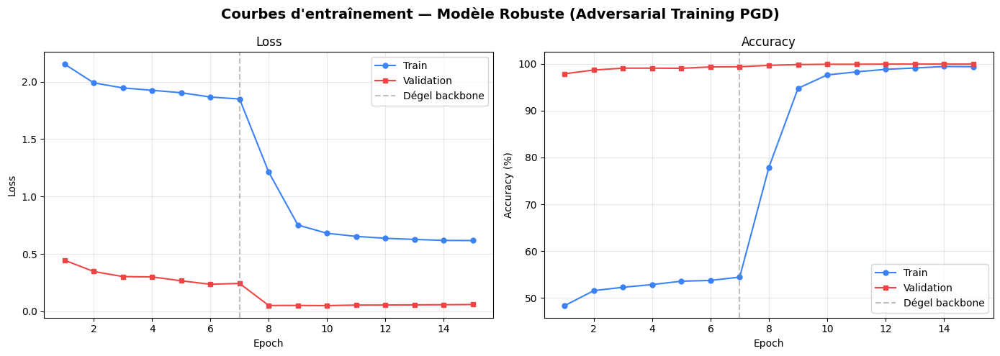

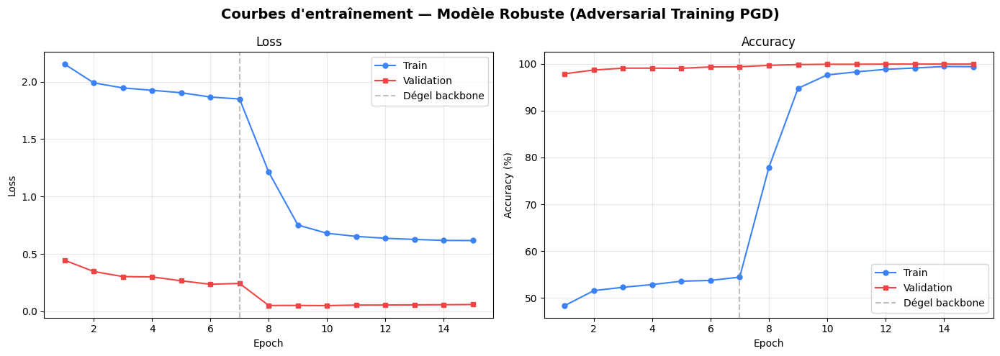

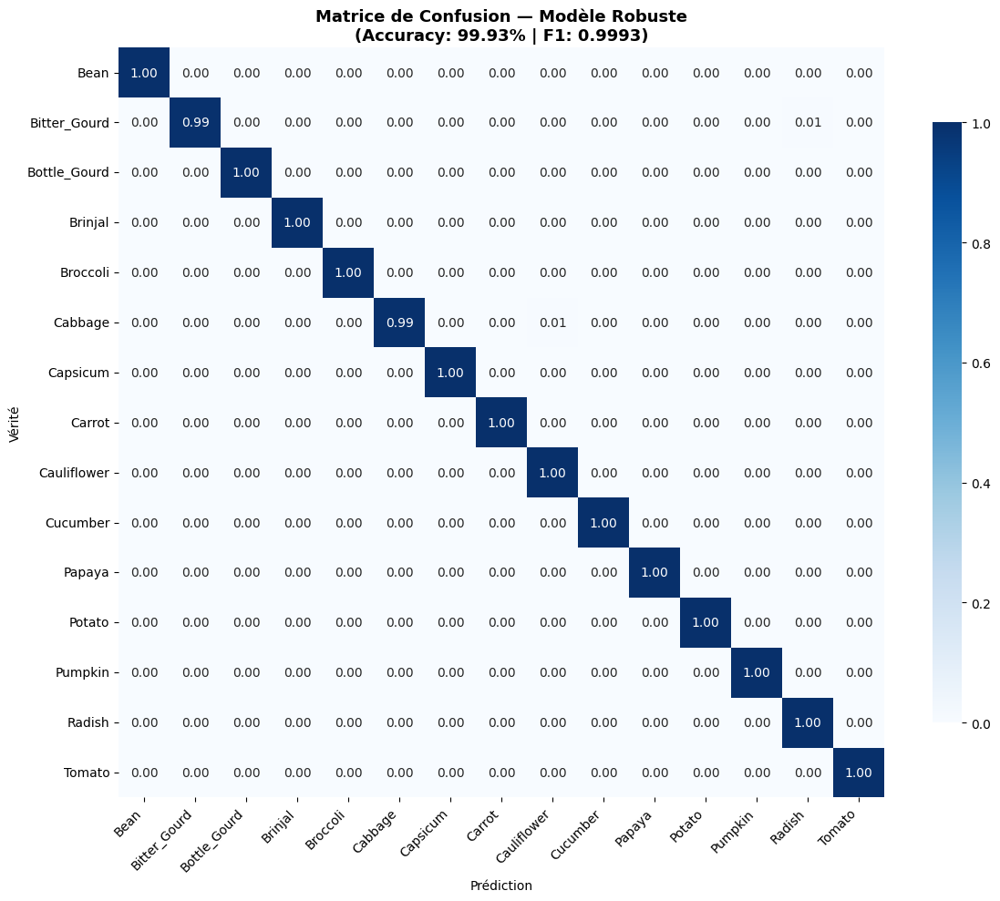

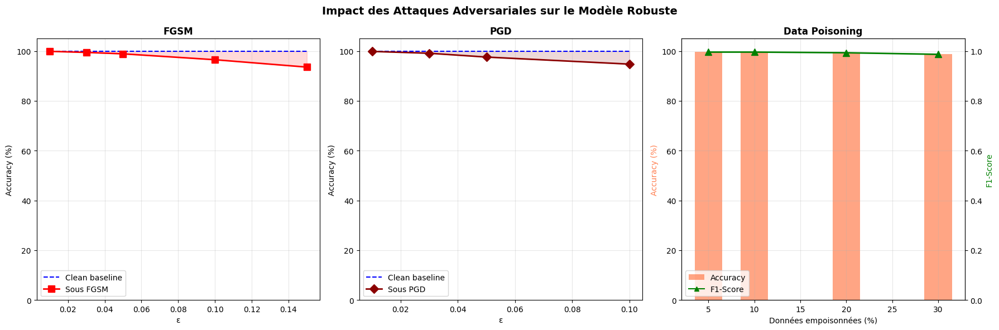

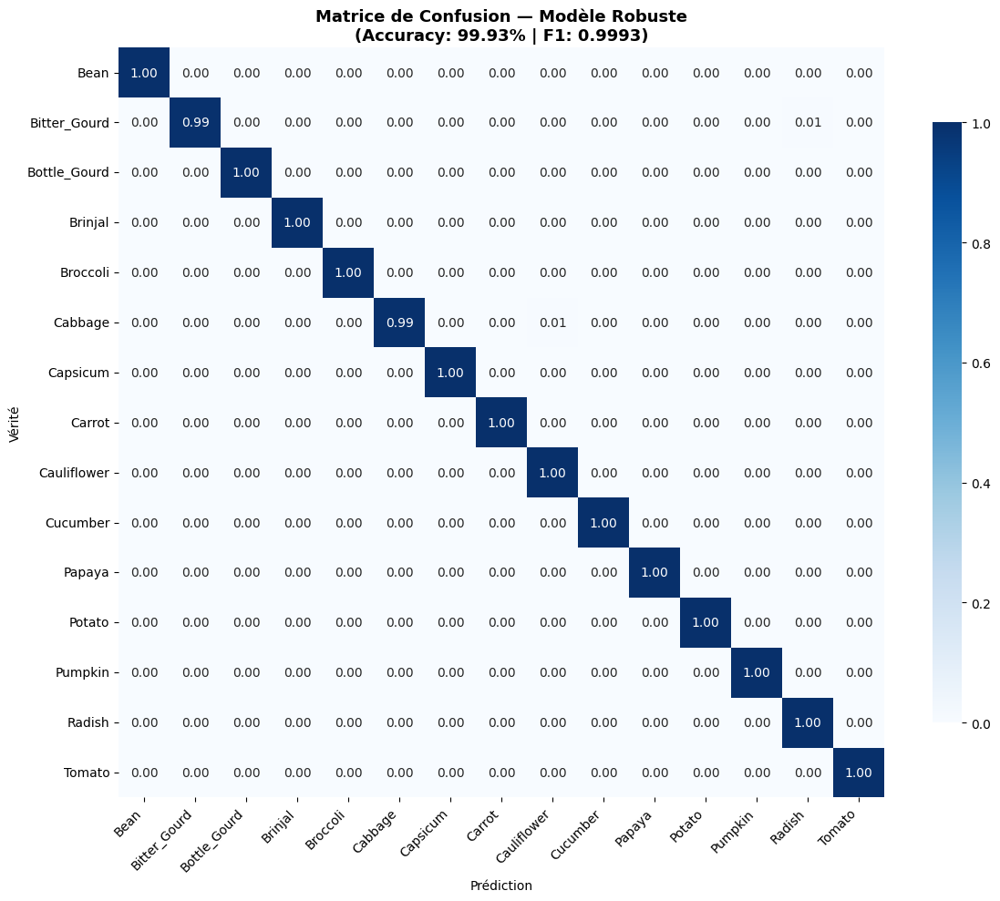

...

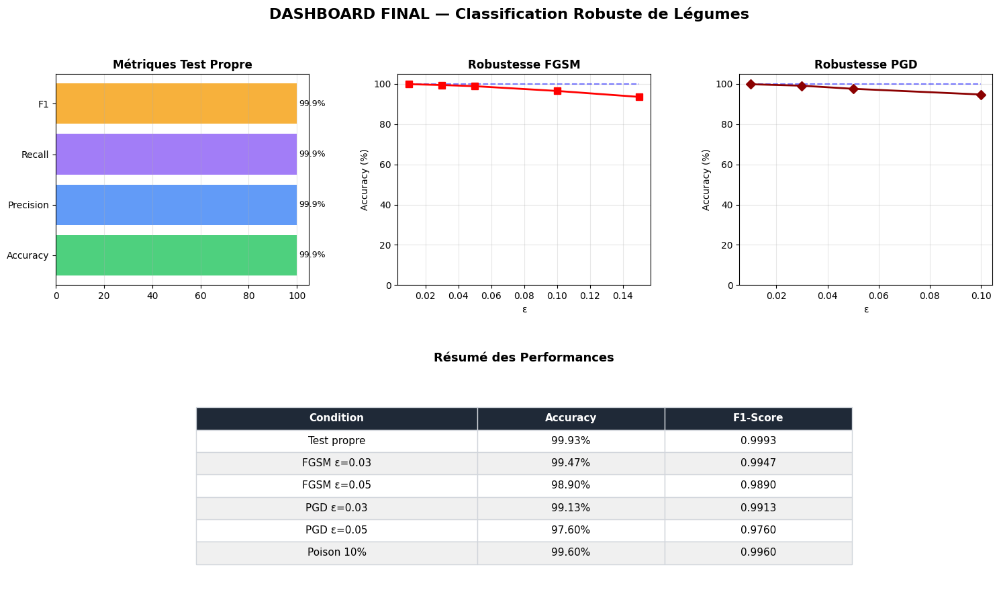

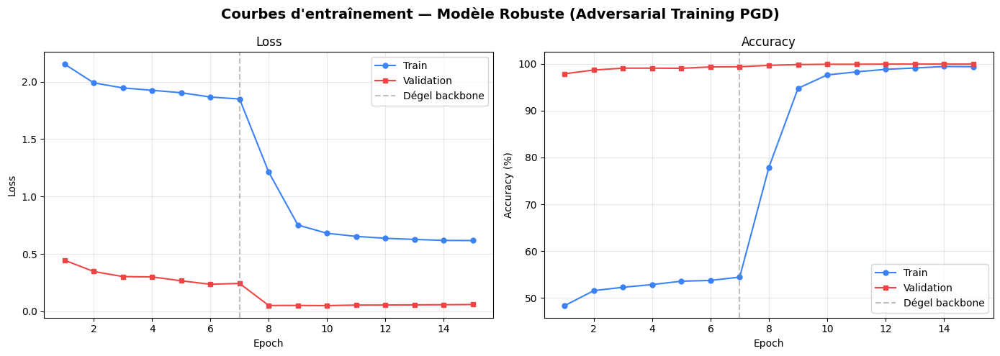

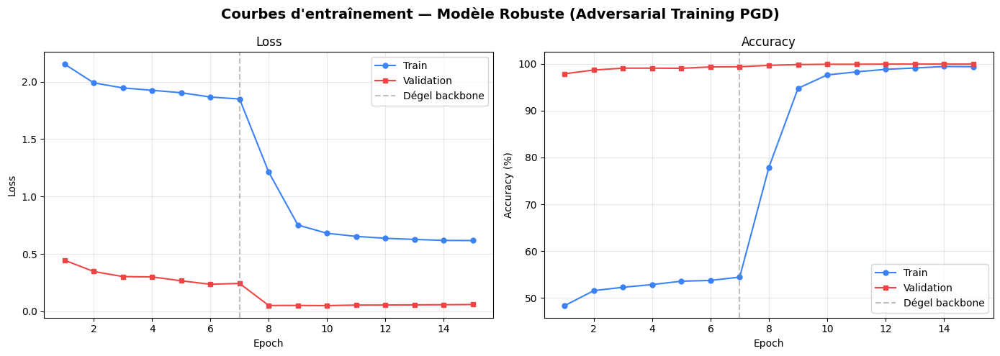

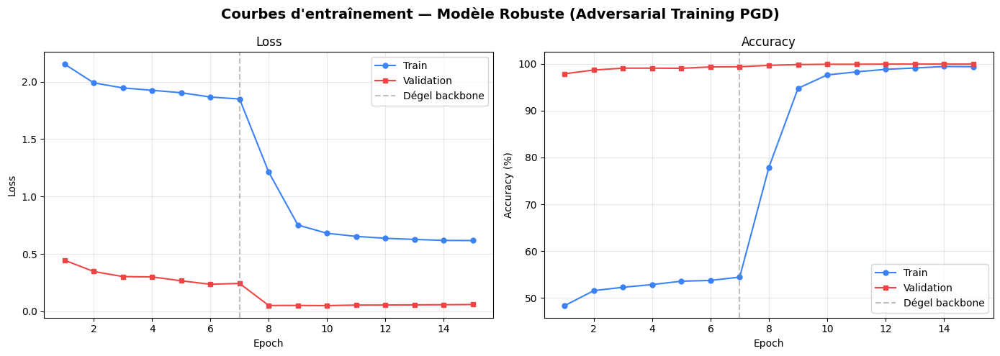

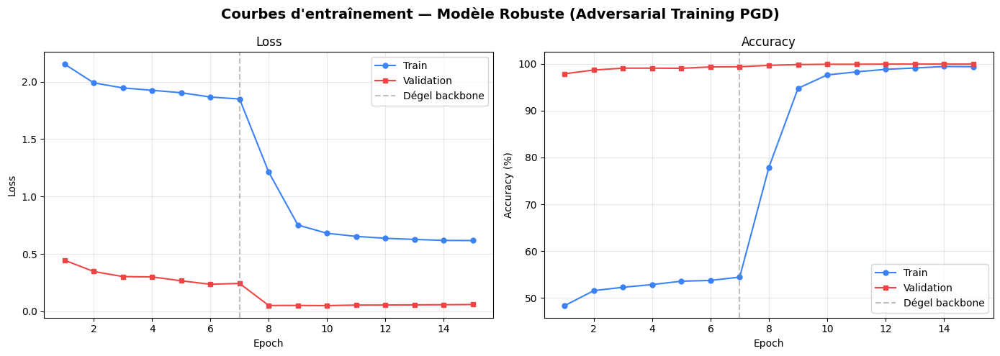

<Figure size 640x480 with 0 Axes>

In [37]:
# %% — Courbes d'entraînement
epochs_range = range(1, len(history["train_loss"]) + 1)

fig, axes = plt.subplots(1, 2, figsize=(14, 5))
fig.suptitle("Courbes d'entraînement — Modèle Robuste (Adversarial Training PGD)", fontsize=14, fontweight='bold')

axes[0].plot(epochs_range, history["train_loss"], 'o-', color='#3b82f6', label='Train', markersize=5)
axes[0].plot(epochs_range, history["val_loss"], 's-', color='#ef4444', label='Validation', markersize=5)
axes[0].axvline(x=PHASE1_EPOCHS, color='gray', ls='--', alpha=0.5, label='Dégel backbone')
axes[0].set_xlabel("Epoch"); axes[0].set_ylabel("Loss")
axes[0].set_title("Loss"); axes[0].legend(); axes[0].grid(alpha=0.3)

axes[1].plot(epochs_range, history["train_acc"], 'o-', color='#3b82f6', label='Train', markersize=5)
axes[1].plot(epochs_range, history["val_acc"], 's-', color='#ef4444', label='Validation', markersize=5)
axes[1].axvline(x=PHASE1_EPOCHS, color='gray', ls='--', alpha=0.5, label='Dégel backbone')
axes[1].set_xlabel("Epoch"); axes[1].set_ylabel("Accuracy (%)")
axes[1].set_title("Accuracy"); axes[1].legend(); axes[1].grid(alpha=0.3)

plt.tight_layout()
plt.show()
plt.savefig(os.path.join(OUTPUT_DIR, "training_curves.png"), dpi=150, bbox_inches='tight')

## Confusion Matrix

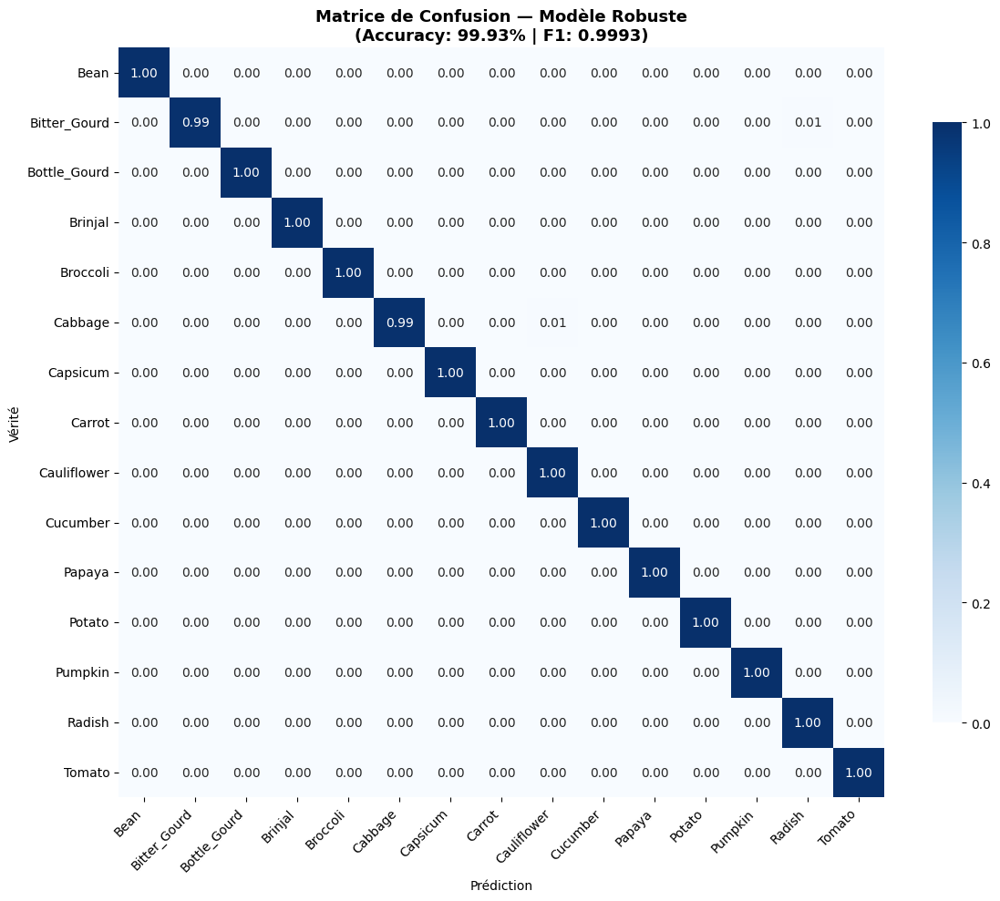

<Figure size 640x480 with 0 Axes>

In [38]:
# %% — Matrice de confusion
fig, ax = plt.subplots(figsize=(12, 10))
cm_norm = clean_cm.astype('float') / clean_cm.sum(axis=1)[:, np.newaxis]
sns.heatmap(cm_norm, annot=True, fmt='.2f', cmap='Blues',
            xticklabels=CLASS_NAMES, yticklabels=CLASS_NAMES, ax=ax, cbar_kws={"shrink": 0.8})
ax.set_title(f"Matrice de Confusion — Modèle Robuste\n(Accuracy: {clean_test_acc:.2f}% | F1: {clean_test_f1:.4f})",
             fontsize=13, fontweight='bold')
ax.set_xlabel("Prédiction"); ax.set_ylabel("Vérité")
plt.setp(ax.get_xticklabels(), rotation=45, ha='right')
plt.tight_layout()
plt.show()
plt.savefig(os.path.join(OUTPUT_DIR, "confusion_matrix.png"), dpi=150, bbox_inches='tight')


## Attack Impact

Text(0.5, 0.98, 'Impact des Attaques Adversariales sur le Modèle Robuste')

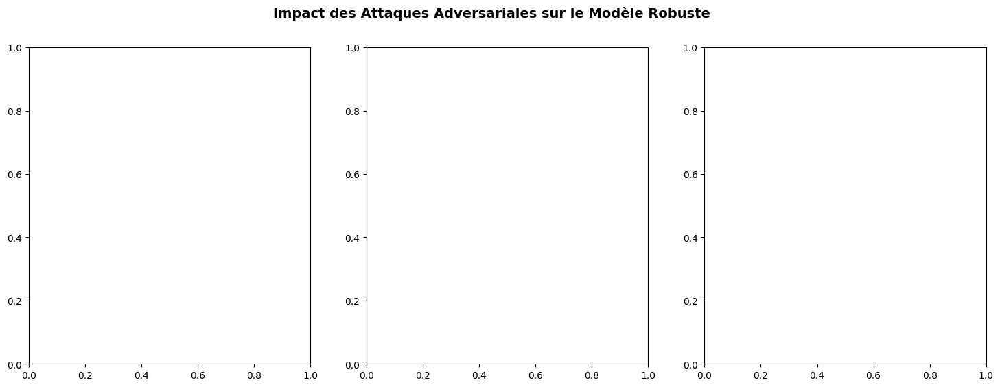

In [39]:
# %% — Impact des attaques
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
fig.suptitle("Impact des Attaques Adversariales sur le Modèle Robuste", fontsize=14, fontweight='bold')

### FGSM

In [40]:
eps_f = [r["epsilon"] for r in fgsm_results]
acc_f = [r["accuracy"] for r in fgsm_results]
axes[0].plot(eps_f, [clean_test_acc]*len(eps_f), 'b--', label='Clean baseline', linewidth=1.5)
axes[0].plot(eps_f, acc_f, 'r-s', label='Sous FGSM', linewidth=2, markersize=8)
axes[0].fill_between(eps_f, acc_f, clean_test_acc, alpha=0.15, color='red')
axes[0].set_title("FGSM", fontweight='bold')
axes[0].set_xlabel("ε"); axes[0].set_ylabel("Accuracy (%)")
axes[0].legend(); axes[0].grid(alpha=0.3); axes[0].set_ylim(0, 105)

(0.0, 105.0)

### PDG

In [41]:
eps_p = [r["epsilon"] for r in pgd_results]
acc_p = [r["accuracy"] for r in pgd_results]
axes[1].plot(eps_p, [clean_test_acc]*len(eps_p), 'b--', label='Clean baseline', linewidth=1.5)
axes[1].plot(eps_p, acc_p, 'darkred', marker='D', label='Sous PGD', linewidth=2, markersize=8)
axes[1].fill_between(eps_p, acc_p, clean_test_acc, alpha=0.15, color='darkred')
axes[1].set_title("PGD", fontweight='bold')
axes[1].set_xlabel("ε"); axes[1].set_ylabel("Accuracy (%)")
axes[1].legend(); axes[1].grid(alpha=0.3); axes[1].set_ylim(0, 105)

(0.0, 105.0)

### Data Poisoning

In [42]:
fracs = [r["fraction"]*100 for r in poison_results]
accs_p = [r["accuracy"] for r in poison_results]
f1s_p = [r["f1"] for r in poison_results]
ax2 = axes[2].twinx()
axes[2].bar(fracs, accs_p, width=3, color='coral', alpha=0.7, label='Accuracy')
ax2.plot(fracs, f1s_p, 'g-^', linewidth=2, markersize=8, label='F1-Score')
axes[2].set_title("Data Poisoning", fontweight='bold')
axes[2].set_xlabel("Données empoisonnées (%)"); axes[2].set_ylabel("Accuracy (%)", color='coral')
ax2.set_ylabel("F1-Score", color='green')
axes[2].set_ylim(0, 105); ax2.set_ylim(0, 1.05)
axes[2].grid(alpha=0.3)
from matplotlib.patches import Patch
axes[2].legend(handles=[Patch(fc='coral', alpha=0.7, label='Accuracy'),
                        plt.Line2D([0],[0], color='g', marker='^', label='F1-Score')], loc='lower left')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "attack_impact.png"), dpi=150, bbox_inches='tight')
plt.show()

<Figure size 640x480 with 0 Axes>

## Visualisation


── Exemples adversariaux visuels ──


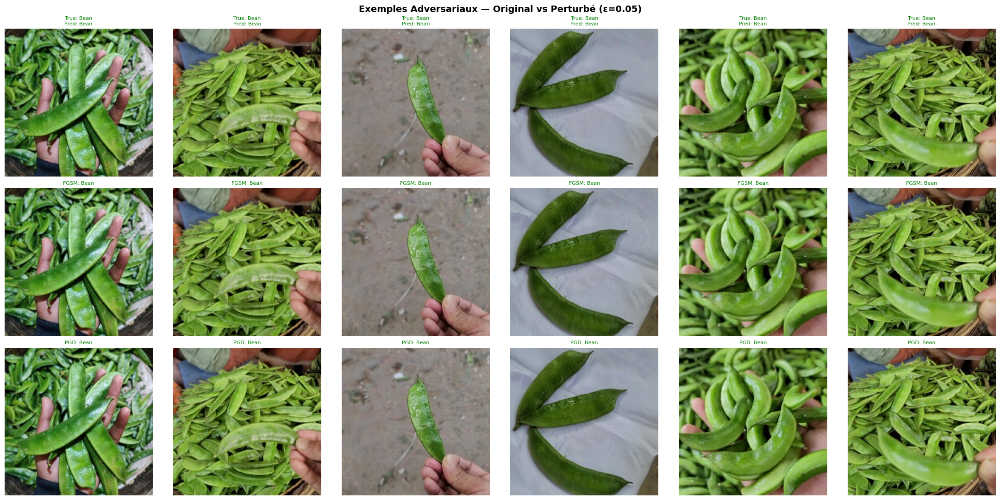

In [43]:
# %% — Visualisation d'exemples adversariaux
print("\n── Exemples adversariaux visuels ──")
model.eval()
sample_images, sample_labels = next(iter(test_loader))
sample_images, sample_labels = sample_images[:6].to(DEVICE), sample_labels[:6].to(DEVICE)

adv_fgsm = fgsm_attack(model, sample_images, sample_labels, 0.05)
adv_pgd  = pgd_attack(model, sample_images, sample_labels, 0.05, ADV_ALPHA, 10)

with torch.no_grad():
    pred_clean = model(sample_images).argmax(1)
    pred_fgsm  = model(adv_fgsm).argmax(1)
    pred_pgd   = model(adv_pgd).argmax(1)

mean_t = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
std_t  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
denorm = lambda img: (img.cpu() * std_t + mean_t).clamp(0, 1).permute(1, 2, 0).numpy()

fig, axes = plt.subplots(3, 6, figsize=(22, 11))
fig.suptitle("Exemples Adversariaux — Original vs Perturbé (ε=0.05)", fontsize=14, fontweight='bold')

for i in range(6):
    true_name = CLASS_NAMES[sample_labels[i]]

    # Original
    axes[0, i].imshow(denorm(sample_images[i]))
    c = 'green' if pred_clean[i] == sample_labels[i] else 'red'
    axes[0, i].set_title(f"True: {true_name}\nPred: {CLASS_NAMES[pred_clean[i]]}", fontsize=8, color=c)
    axes[0, i].axis('off')

    # FGSM
    axes[1, i].imshow(denorm(adv_fgsm[i]))
    c = 'green' if pred_fgsm[i] == sample_labels[i] else 'red'
    axes[1, i].set_title(f"FGSM: {CLASS_NAMES[pred_fgsm[i]]}", fontsize=8, color=c)
    axes[1, i].axis('off')

    # PGD
    axes[2, i].imshow(denorm(adv_pgd[i]))
    c = 'green' if pred_pgd[i] == sample_labels[i] else 'red'
    axes[2, i].set_title(f"PGD: {CLASS_NAMES[pred_pgd[i]]}", fontsize=8, color=c)
    axes[2, i].axis('off')

for ax, lbl in zip(axes[:, 0], ["Original", "FGSM ε=0.05", "PGD ε=0.05"]):
    ax.set_ylabel(lbl, fontsize=11, fontweight='bold', rotation=0, labelpad=70, va='center')

plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "adversarial_examples.png"), dpi=150, bbox_inches='tight')
plt.show()

# Conclusion


── TABLEAU RÉCAPITULATIF ──

Condition                        Accuracy   F1-Score
────────────────────────────────────────────────────
Test propre (clean)                99.93%     0.9993

FGSM ε=0.01                        99.90%     0.9990
FGSM ε=0.03                        99.47%     0.9947
FGSM ε=0.05                        98.90%     0.9890
FGSM ε=0.1                         96.53%     0.9653
FGSM ε=0.15                        93.57%     0.9356

PGD ε=0.01                         99.87%     0.9987
PGD ε=0.03                         99.13%     0.9913
PGD ε=0.05                         97.60%     0.9760
PGD ε=0.1                          94.77%     0.9478

Poison 5%                          99.60%     0.9960
Poison 10%                         99.60%     0.9960
Poison 20%                         99.33%     0.9933
Poison 30%                         98.70%     0.9870


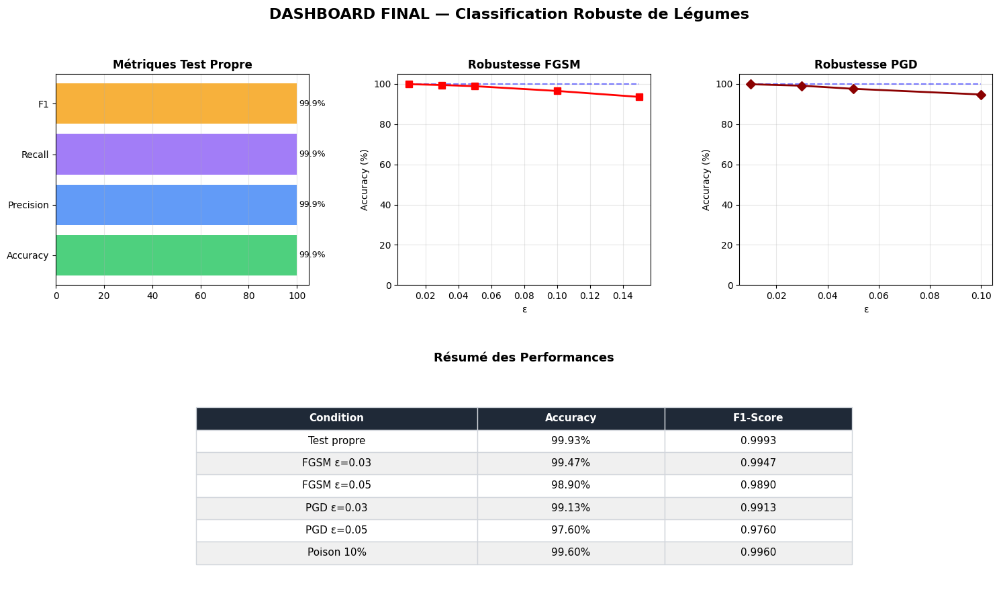

In [44]:
# %% — Tableau récapitulatif
print("\n── TABLEAU RÉCAPITULATIF ──\n")

print(f"{'Condition':<30} {'Accuracy':>10} {'F1-Score':>10}")
print("─" * 52)
print(f"{'Test propre (clean)':<30} {clean_test_acc:>9.2f}% {clean_test_f1:>10.4f}")
print()

for r in fgsm_results:
    print(f"{'FGSM ε=' + str(r['epsilon']):<30} {r['accuracy']:>9.2f}% {r['f1']:>10.4f}")
print()

for r in pgd_results:
    print(f"{'PGD ε=' + str(r['epsilon']):<30} {r['accuracy']:>9.2f}% {r['f1']:>10.4f}")
print()

for r in poison_results:
    print(f"{'Poison ' + str(int(r['fraction']*100)) + '%':<30} {r['accuracy']:>9.2f}% {r['f1']:>10.4f}")

# %% — Dashboard final
fig = plt.figure(figsize=(18, 10))
gs = gridspec.GridSpec(2, 3, hspace=0.45, wspace=0.35)
fig.suptitle("DASHBOARD FINAL — Classification Robuste de Légumes", fontsize=16, fontweight='bold', y=0.98)

# 1 — Métriques
ax1 = fig.add_subplot(gs[0, 0])
metrics = ['Accuracy', 'Precision', 'Recall', 'F1']
vals = [clean_test_acc, precision*100, recall*100, f1*100]
bars = ax1.barh(metrics, vals, color=['#22c55e', '#3b82f6', '#8b5cf6', '#f59e0b'], alpha=0.8)
ax1.set_xlim(0, 105); ax1.set_title("Métriques Test Propre", fontweight='bold')
ax1.grid(alpha=0.3, axis='x')
for bar, v in zip(bars, vals):
    ax1.text(bar.get_width() + 1, bar.get_y() + bar.get_height()/2, f'{v:.1f}%', va='center', fontsize=9)

# 2 — FGSM
ax2 = fig.add_subplot(gs[0, 1])
ax2.plot(eps_f, [clean_test_acc]*len(eps_f), 'b--', alpha=0.5)
ax2.plot(eps_f, acc_f, 'r-s', linewidth=2, markersize=7)
ax2.set_title("Robustesse FGSM", fontweight='bold'); ax2.set_xlabel("ε")
ax2.set_ylabel("Accuracy (%)"); ax2.set_ylim(0, 105); ax2.grid(alpha=0.3)

# 3 — PGD
ax3 = fig.add_subplot(gs[0, 2])
ax3.plot(eps_p, [clean_test_acc]*len(eps_p), 'b--', alpha=0.5)
ax3.plot(eps_p, acc_p, 'darkred', marker='D', linewidth=2, markersize=7)
ax3.set_title("Robustesse PGD", fontweight='bold'); ax3.set_xlabel("ε")
ax3.set_ylabel("Accuracy (%)"); ax3.set_ylim(0, 105); ax3.grid(alpha=0.3)

# 4 — Tableau
ax4 = fig.add_subplot(gs[1, :])
ax4.axis('off')
table_data = [
    ["Test propre",  f"{clean_test_acc:.2f}%",  f"{clean_test_f1:.4f}"],
    ["FGSM ε=0.03",  f"{fgsm_results[1]['accuracy']:.2f}%",  f"{fgsm_results[1]['f1']:.4f}"],
    ["FGSM ε=0.05",  f"{fgsm_results[2]['accuracy']:.2f}%",  f"{fgsm_results[2]['f1']:.4f}"],
    ["PGD ε=0.03",   f"{pgd_results[1]['accuracy']:.2f}%",   f"{pgd_results[1]['f1']:.4f}"],
    ["PGD ε=0.05",   f"{pgd_results[2]['accuracy']:.2f}%",   f"{pgd_results[2]['f1']:.4f}"],
    ["Poison 10%",   f"{poison_results[1]['accuracy']:.2f}%", f"{poison_results[1]['f1']:.4f}"],
]
table = ax4.table(cellText=table_data, colLabels=["Condition", "Accuracy", "F1-Score"],
                  cellLoc='center', loc='center', colWidths=[0.3, 0.2, 0.2])
table.auto_set_font_size(False); table.set_fontsize(11); table.scale(1, 2)
for (r, c), cell in table.get_celld().items():
    if r == 0:
        cell.set_facecolor('#1f2937'); cell.set_text_props(color='white', fontweight='bold')
    elif r % 2 == 0:
        cell.set_facecolor('#f0f0f0')
    cell.set_edgecolor('#d1d5db')
ax4.set_title("Résumé des Performances", fontweight='bold', fontsize=13, pad=20)

plt.savefig(os.path.join(OUTPUT_DIR, "final_dashboard.png"), dpi=150, bbox_inches='tight')
plt.show()

# Prediction

In [25]:
# %% — Test de prédiction final
print("\n" + "=" * 65)
print(" CONCLUSION — TEST DE PRÉDICTION")
print("=" * 65)

model.eval()
test_images, test_labels = next(iter(test_loader))
test_images, test_labels = test_images[:10].to(DEVICE), test_labels[:10].to(DEVICE)

# Prédictions propres
with torch.no_grad():
    logits = model(test_images)
    probs = F.softmax(logits, dim=1)
    preds = logits.argmax(1)
    confs = probs.max(1)[0]

print(f"\n{'#':<4} {'Vrai Label':<20} {'Prédiction':<20} {'Confiance':>10} {'Status'}")
print("─" * 62)
for i in range(10):
    true_n = CLASS_NAMES[test_labels[i]]
    pred_n = CLASS_NAMES[preds[i]]
    ok = "ok" if preds[i] == test_labels[i] else "no"
    print(f" {i+1:<3} {true_n:<20} {pred_n:<20} {confs[i].item():>9.4f}  {ok}")

clean_correct = preds.eq(test_labels).sum().item()

# Prédictions sous PGD
adv_test = pgd_attack(model, test_images, test_labels, 0.03, ADV_ALPHA, 10)
with torch.no_grad():
    logits_adv = model(adv_test)
    probs_adv = F.softmax(logits_adv, dim=1)
    preds_adv = logits_adv.argmax(1)
    confs_adv = probs_adv.max(1)[0]

print(f"\n── Sous attaque PGD ε=0.03 ──")
print(f"{'#':<4} {'Vrai Label':<20} {'Prédiction':<20} {'Confiance':>10} {'Status'}")
print("─" * 62)
for i in range(10):
    true_n = CLASS_NAMES[test_labels[i]]
    pred_n = CLASS_NAMES[preds_adv[i]]
    ok = "ok" if preds_adv[i] == test_labels[i] else "no"
    print(f" {i+1:<3} {true_n:<20} {pred_n:<20} {confs_adv[i].item():>9.4f}  {ok}")

adv_correct = preds_adv.eq(test_labels).sum().item()

print(f"\nScore sur 10 images:")
print(f"   Clean: {clean_correct}/10")
print(f"   PGD:   {adv_correct}/10")


 CONCLUSION — TEST DE PRÉDICTION

#    Vrai Label           Prédiction            Confiance Status
──────────────────────────────────────────────────────────────
 1   Bean                 Bean                    0.9641  ok
 2   Bean                 Bean                    0.9323  ok
 3   Bean                 Bean                    0.9900  ok
 4   Bean                 Bean                    0.9358  ok
 5   Bean                 Bean                    0.9341  ok
 6   Bean                 Bean                    0.9208  ok
 7   Bean                 Bean                    0.9459  ok
 8   Bean                 Bean                    0.9703  ok
 9   Bean                 Bean                    0.9522  ok
 10  Bean                 Bean                    0.9853  ok

── Sous attaque PGD ε=0.03 ──
#    Vrai Label           Prédiction            Confiance Status
──────────────────────────────────────────────────────────────
 1   Bean                 Bean                    0.9239  ok
 2   Be

# Prediction (on our own dataset)

In [47]:
# ── Charger mes images ──
# Mets tes images dans un dossier uploadé sur Kaggle
MY_IMAGES_DIR = "/kaggle/input/advrsvegetable" 
image_paths = sorted(glob.glob(os.path.join(MY_IMAGES_DIR, "*.*")))
image_paths = [p for p in image_paths if p.lower().endswith(('.jpg', '.jpeg', '.png', '.webp'))]

print(f"Images trouvées: {len(image_paths)}")
for p in image_paths:
    print(f"  • {os.path.basename(p)}")

Images trouvées: 10
  • Kidney-beans-8496667.jpg
  • images (1).jpeg
  • images (2).jpeg
  • images (3).jpeg
  • images (4).jpeg
  • images (5).jpeg
  • images (6).jpeg
  • images (7).jpeg
  • images (8).jpeg
  • images.jpeg



 PRÉDICTIONS SUR MES IMAGES (clean)

📷 Kidney-beans-8496667.jpg
  → Capsicum              21.97%
    Potato                11.87%
    Tomato                 8.66%

📷 images (1).jpeg
  → Carrot                54.43%
    Bottle_Gourd          10.83%
    Potato                 7.40%

📷 images (2).jpeg
  → Tomato                32.51%
    Radish                13.03%
    Bitter_Gourd           8.78%

📷 images (3).jpeg
  → Potato                48.68%
    Brinjal                5.80%
    Capsicum               5.46%

📷 images (4).jpeg
  → Cabbage               81.12%
    Cauliflower            3.01%
    Capsicum               2.52%

📷 images (5).jpeg
  → Broccoli              95.02%
    Cauliflower            0.72%
    Potato                 0.63%

📷 images (6).jpeg
  → Papaya                23.92%
    Cauliflower           11.74%
    Potato                10.95%

📷 images (7).jpeg
  → Carrot                21.18%
    Radish                15.06%
    Bottle_Gourd           8.74%

📷 images 

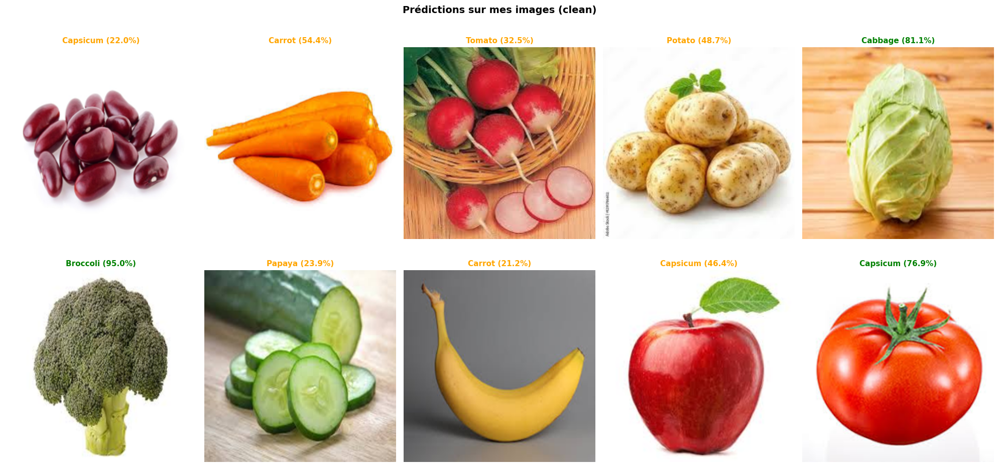

In [48]:
# ── Prédictions propres sur toutes les images ──
print("\n" + "=" * 60)
print(" PRÉDICTIONS SUR MES IMAGES (clean)")
print("=" * 60)

model.eval()
my_tensors = []
my_names = []

fig_cols = min(len(image_paths), 5)
fig_rows = (len(image_paths) + fig_cols - 1) // fig_cols
fig, axes = plt.subplots(fig_rows, fig_cols, figsize=(4 * fig_cols, 5 * fig_rows))
if fig_rows == 1 and fig_cols == 1:
    axes = np.array([axes])
axes = axes.flatten()

for i, path in enumerate(image_paths):
    img_pil = Image.open(path).convert("RGB")
    tensor = eval_transform(img_pil).unsqueeze(0).to(DEVICE)
    my_tensors.append(tensor)
    my_names.append(os.path.basename(path))

    with torch.no_grad():
        logits = model(tensor)
        probs = F.softmax(logits, dim=1)[0]
        top3_probs, top3_idx = probs.topk(3)

    pred_name = CLASS_NAMES[top3_idx[0]]
    conf = top3_probs[0].item() * 100

    print(f"\n📷 {my_names[i]}")
    for rank, (idx, prob) in enumerate(zip(top3_idx, top3_probs)):
        marker = "→" if rank == 0 else " "
        print(f"  {marker} {CLASS_NAMES[idx]:<20} {prob.item()*100:6.2f}%")

    # Affichage
    img_display = img_pil.resize((IMAGE_SIZE, IMAGE_SIZE))
    axes[i].imshow(img_display)
    axes[i].set_title(f"{pred_name} ({conf:.1f}%)", fontsize=11,
                      color='green' if conf > 70 else 'orange', fontweight='bold')
    axes[i].axis('off')

for j in range(len(image_paths), len(axes)):
    axes[j].axis('off')

fig.suptitle("Prédictions sur mes images (clean)", fontsize=14, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "my_predictions_clean.png"), dpi=150, bbox_inches='tight')
plt.show()


 ATTAQUE FGSM SUR UNE IMAGE

 Image: images (1).jpeg
   Prédiction clean: Carrot (54.43%)

ε        Prédiction            Confiance Status
─────────────────────────────────────────────
0.01     Carrot                   44.32%  OK
0.03     Carrot                   28.73%  OK
0.05     Carrot                   20.05%  OK
0.1      Potato                   26.48%   FOOLED
0.2      Potato                   43.81%   FOOLED


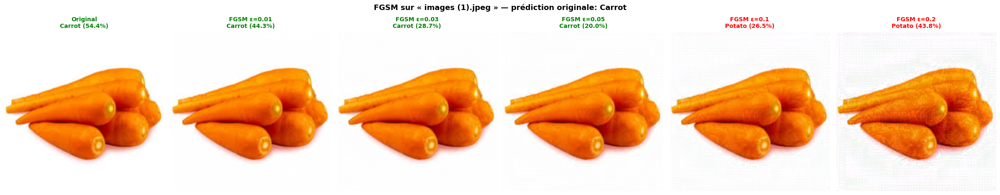


 Figures sauvegardées dans /kaggle/working/


In [51]:
# ── FGSM l'image ──
print("\n" + "=" * 60)
print(" ATTAQUE FGSM SUR UNE IMAGE")
print("=" * 60)

target_idx = 1  # ← change l'index pour choisir une autre image
target_tensor = my_tensors[target_idx].clone()
target_name = my_names[target_idx]

# Prédiction clean
with torch.no_grad():
    clean_logits = model(target_tensor)
    clean_probs = F.softmax(clean_logits, dim=1)[0]
    clean_pred = clean_logits.argmax(1).item()
    clean_conf = clean_probs[clean_pred].item() * 100

print(f"\n Image: {target_name}")
print(f"   Prédiction clean: {CLASS_NAMES[clean_pred]} ({clean_conf:.2f}%)")

# Appliquer FGSM avec différents epsilon
epsilons_demo = [0.01, 0.03, 0.05, 0.1, 0.2]

fig, axes = plt.subplots(1, len(epsilons_demo) + 1, figsize=(4 * (len(epsilons_demo) + 1), 5))

# Image originale
mean_t = torch.tensor([0.485, 0.456, 0.406]).view(3, 1, 1)
std_t  = torch.tensor([0.229, 0.224, 0.225]).view(3, 1, 1)
denorm = lambda t: (t.cpu() * std_t + mean_t).clamp(0, 1).squeeze(0).permute(1, 2, 0).numpy()

axes[0].imshow(denorm(target_tensor))
axes[0].set_title(f"Original\n{CLASS_NAMES[clean_pred]} ({clean_conf:.1f}%)",
                  fontsize=10, fontweight='bold', color='green')
axes[0].axis('off')

print(f"\n{'ε':<8} {'Prédiction':<20} {'Confiance':>10} {'Status'}")
print("─" * 45)

for i, eps in enumerate(epsilons_demo):
    # FGSM
    inp = target_tensor.clone().detach().requires_grad_(True)
    loss = F.cross_entropy(model(inp), torch.tensor([clean_pred]).to(DEVICE))
    model.zero_grad()
    loss.backward()
    adv_tensor = (inp + eps * inp.grad.sign()).detach()

    # Prédiction adversariale
    with torch.no_grad():
        adv_logits = model(adv_tensor)
        adv_probs = F.softmax(adv_logits, dim=1)[0]
        adv_pred = adv_logits.argmax(1).item()
        adv_conf = adv_probs[adv_pred].item() * 100

    fooled = adv_pred != clean_pred
    status = " FOOLED" if fooled else "OK"
    print(f"{eps:<8} {CLASS_NAMES[adv_pred]:<20} {adv_conf:>9.2f}%  {status}")

    axes[i + 1].imshow(denorm(adv_tensor))
    color = 'red' if fooled else 'green'
    axes[i + 1].set_title(f"FGSM ε={eps}\n{CLASS_NAMES[adv_pred]} ({adv_conf:.1f}%)",
                          fontsize=10, fontweight='bold', color=color)
    axes[i + 1].axis('off')

fig.suptitle(f"FGSM sur « {target_name} » — prédiction originale: {CLASS_NAMES[clean_pred]}",
             fontsize=13, fontweight='bold')
plt.tight_layout()
plt.savefig(os.path.join(OUTPUT_DIR, "my_fgsm_demo.png"), dpi=150, bbox_inches='tight')
plt.show()

print(f"\n Figures sauvegardées dans {OUTPUT_DIR}/")

###